In [1]:
import numpy as np
import pandas as pd
import torch
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import os
import sys
from pathlib import Path

notebook_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.append(notebook_dir)

root_dir = Path(notebook_dir)

from PIL import Image, ImageFile
from tqdm import tqdm

from YOLOV3.dataset import YOLODataset
from YOLOV3.dataloader import get_loaders
import YOLOV3.config as config

from YOLOV3.utils import (
    cells_to_bboxes,
    iou_width_height as iou,
    non_max_suppression as nms,
    plot_image,
    mean_average_precision,
    cells_to_bboxes,
    get_evaluation_bboxes,
    save_checkpoint,
    load_checkpoint,
    check_class_accuracy,
    plot_couple_examples,
    plot_image_no_padding,
)

from YOLOV3.loss import YoloLoss

torch.backends.cudnn.benchmark = True

ImageFile.LOAD_TRUNCATED_IMAGES = True

check pytorch installation

In [2]:
print(torch.rand(5, 3))
print(torch.cuda.is_available())
print(torch.cuda.get_device_name())
print (torch.cuda.current_device())
print (torch.version.cuda)

tensor([[0.3578, 0.4777, 0.1562],
        [0.9208, 0.1567, 0.7745],
        [0.6656, 0.7850, 0.5227],
        [0.0700, 0.3515, 0.2545],
        [0.5305, 0.8007, 0.4359]])
True
NVIDIA GeForce RTX 3070 Laptop GPU
0
13.0


In [3]:
from YOLOV3.utils import seed_everything

seed_everything(seed = 2517)

### Plot a few samples from the dataset

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


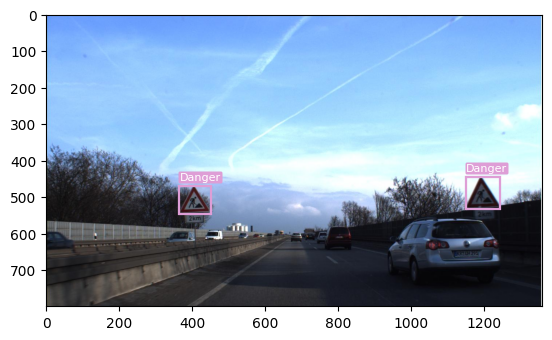

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


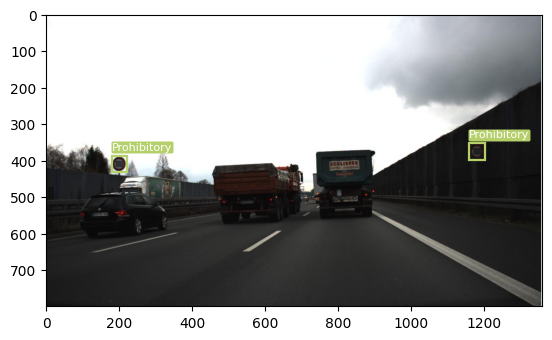

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


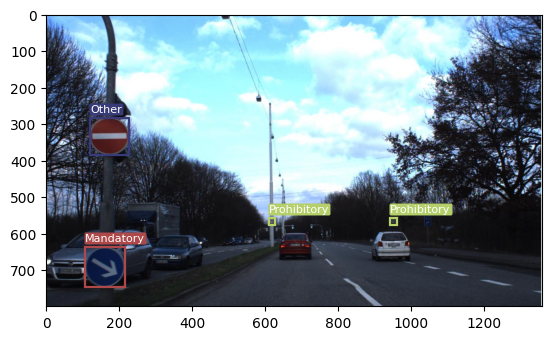

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


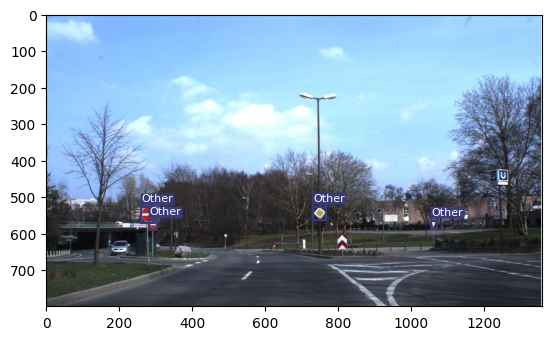

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


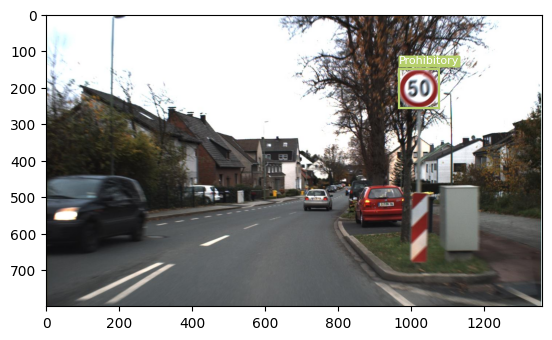

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


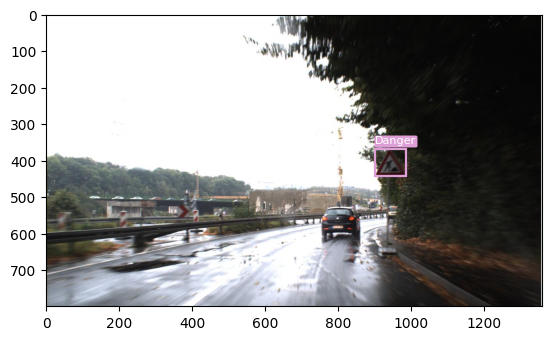

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


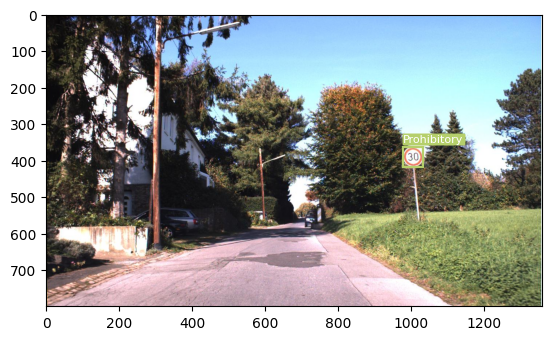

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


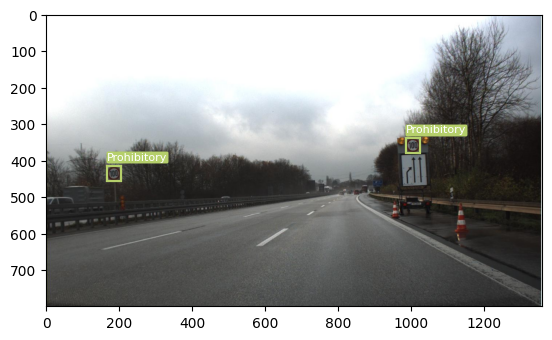

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


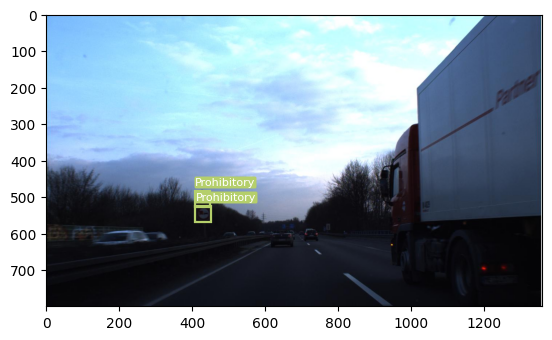

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


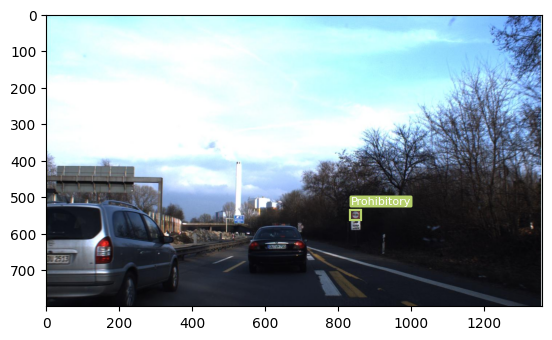

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


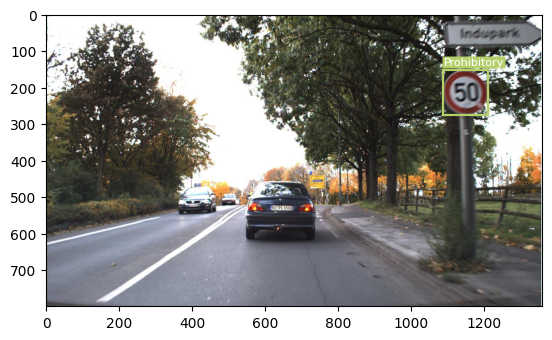

torch.Size([3, 2])
torch.Size([1, 3, 13, 13, 6])
torch.Size([3, 2])
torch.Size([1, 3, 26, 26, 6])
torch.Size([3, 2])
torch.Size([1, 3, 52, 52, 6])


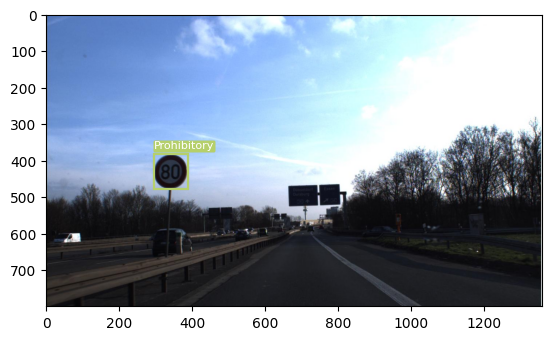

In [4]:
anchors = config.ANCHORS

transform = config.test_transforms

dataset = YOLODataset(
    root_dir/ "GTSDB_YOLO"/"train.csv",
    root_dir/ "GTSDB_YOLO"/"images",
    root_dir/ "GTSDB_YOLO"/"labels",
    S=[13, 26, 52],
    anchors=anchors,
    transform= None,
    image_size= config.IMAGE_SIZE,
    C= config.NUM_CLASSES,
)
S = [13, 26, 52]
scaled_anchors = torch.tensor(anchors) / (
    1 / torch.tensor(S).unsqueeze(1).unsqueeze(1).repeat(1, 3, 2)
)
loader = DataLoader(dataset=dataset, batch_size=1, shuffle=True)

for index, (x, y) in enumerate (loader):
    boxes = []

    for i in range(y[0].shape[1]):
        anchor = scaled_anchors[i]
        print(anchor.shape)
        print(y[i].shape)
        boxes += cells_to_bboxes(
            y[i], is_preds=False, S=y[i].shape[2], anchors=anchor
        )[0]
    boxes = nms(boxes, iou_threshold=1, threshold=0.7, box_format="midpoint")
    # print(boxes)
    plot_image_no_padding(x[0].permute(1, 2, 0).to("cpu"), boxes, class_labels_list = config.Reduced_GTSDB_Classes)
    
    if index > 10 :

        break

### Load a COCO pretrained check point
We will initialize a model with the same architecture as YOLOV3 trained on MS COCO so we can load the pretrained weights.

In [5]:
from YOLOV3.model_with_weights2 import YOLOv3

model = YOLOv3(num_classes = 80).to(config.DEVICE)

# Count number of trainable parameters
total_params = sum(
p.numel() for p in model.parameters() if p.requires_grad
)
total_params

61950679

In [6]:
print (model)

YOLOv3(
  (layers): ModuleList(
    (0): CNNBlock(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky): LeakyReLU(negative_slope=0.1)
    )
    (1): CNNBlock(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky): LeakyReLU(negative_slope=0.1)
    )
    (2): ResidualBlock(
      (layers): ModuleList(
        (0): Sequential(
          (0): CNNBlock(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (leaky): LeakyReLU(negative_slope=0.1)
          )
          (1): CNNBlock(
            (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=

Setup optimizers, loss function, scalar, dataloaders

In [7]:
optimizer = optim.Adam(
    model.parameters(), lr=config.LEARNING_RATE, weight_decay=config.WEIGHT_DECAY
)
loss_fn = YoloLoss()
scaler = torch.amp.GradScaler(device= config.DEVICE)

train_loader, test_loader, train_eval_loader = get_loaders(
    train_csv_path= root_dir/ "GTSDB_YOLO"/"train.csv", test_csv_path=root_dir/ "GTSDB_YOLO"/"test.csv", DATASET= config.DETECTION_DATASET
)

Load the pretrained weights of YOLOV3

In [8]:
if config.LOAD_MODEL:
    load_checkpoint(
          checkpoint_file= root_dir/ "checkpoints//YOLOV3_MSCOCO_Orignal.pth.tar",
          model= model, 
          optimizer= optimizer, 
          lr= config.LEARNING_RATE
    )
model = model.to(config.DEVICE)

scaled_anchors = (
    torch.tensor(config.ANCHORS)
    * torch.tensor(config.S).unsqueeze(1).unsqueeze(1).repeat(1, 3, 2)
).to(config.DEVICE)

=> Loading checkpoint


In [9]:
# plot_couple_examples(model, test_loader, 0.8, 0.6, scaled_anchors, class_labels_list = config.COCO_LABELS)

### Adapt the model for our dataset
YOLOV3 trained on MS COCO has 255 output channels on its detection heads. 
COCO has 80 classes so the output channels  = number of filters = 3 × (5 + 80 classes) = 255

We will change it so that output channels = number of filters = 3 × (5 + 4 super-classes) = 27

In [10]:
# filters = 3 × (5 + Num_classes)
model.layers[15]

ScalePrediction(
  (pred): Sequential(
    (0): CNNBlock(
      (conv): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky): LeakyReLU(negative_slope=0.1)
    )
    (1): CNNBlock(
      (conv): Conv2d(1024, 255, kernel_size=(1, 1), stride=(1, 1))
      (bn): BatchNorm2d(255, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky): LeakyReLU(negative_slope=0.1)
    )
  )
)

In [11]:
from YOLOV3.model_with_weights2 import CNNBlock

model.layers[15].pred[1] = CNNBlock(1024, 3*(5+config.NUM_CLASSES), bn_act=False, kernel_size=1)
model.layers[22].pred[1] = CNNBlock(512, 3*(5+config.NUM_CLASSES), bn_act=False, kernel_size=1)
model.layers[29].pred[1] = CNNBlock(256, 3*(5+config.NUM_CLASSES), bn_act=False, kernel_size=1)

In [12]:
# Correct the number of classes (used to compute the forward pass)
model.num_classes= config.NUM_CLASSES

model.layers[15].num_classes = config.NUM_CLASSES
model.layers[22].num_classes = config.NUM_CLASSES
model.layers[29].num_classes = config.NUM_CLASSES

In [13]:
model.layers[15]

ScalePrediction(
  (pred): Sequential(
    (0): CNNBlock(
      (conv): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky): LeakyReLU(negative_slope=0.1)
    )
    (1): CNNBlock(
      (conv): Conv2d(1024, 27, kernel_size=(1, 1), stride=(1, 1))
      (bn): BatchNorm2d(27, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leaky): LeakyReLU(negative_slope=0.1)
    )
  )
)

### Freeze all the layers except the detection heads
We will keep the MS COCO trained weights for all layers. For fine tuning on our dataset, we will train all the layers except the "darknet 53" backbone. 
- Freeze all model layers (requires grad = False).
- Unfreeze only the last layer in each detection head (requires grad = True)
- Unfreeze more layers till the backbone, if necessary

In [14]:
# Count number of trainable parameters
total_params = sum(
p.numel() for p in model.parameters() if p.requires_grad
)
total_params

61540051

In [15]:
# Freeze all layers
for layer in model.layers:
    for param in layer.parameters():
        param.requires_grad = False

In [16]:
# Unfreeze all the layers after the 11th block
for i in [12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]:
    for param in model.layers[i].parameters():
        param.requires_grad = True

In [17]:
# Count number of trainable parameters
total_params = sum(
p.numel() for p in model.parameters() if p.requires_grad
)
total_params

model = model.to(config.DEVICE)  

total_params

20429811

### Train and fine tune the model on our dataset

In [18]:
# if config.LOAD_MODEL:
#     load_checkpoint(
#           checkpoint_file= root_dir/ "checkpoints//checkpointv3.pth.tar",
#           model= model, 
#           optimizer= optimizer, 
#           lr= config.LEARNING_RATE
#     )

# model = model.to(config.DEVICE)

# scaled_anchors = (
#     torch.tensor(config.ANCHORS)
#     * torch.tensor(config.S).unsqueeze(1).unsqueeze(1).repeat(1, 3, 2)
# ).to(config.DEVICE)


Check for parameter count after reloading to make sure that the requires_grad setting is correct

In [19]:
# Unfreeze all the layers after the 11th block
for i in [4, 5, 6, 7, 8, 9, 10 ,11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]:
    for param in model.layers[i].parameters():
        param.requires_grad = True

In [20]:
# Count number of trainable parameters
total_params = sum(
p.numel() for p in model.parameters() if p.requires_grad
)
total_params

model = model.to(config.DEVICE)  

total_params

61425907

In [21]:
from YOLOV3.train import train_fn

for epoch in range(config.NUM_EPOCHS+1):
    train_fn(train_loader, model, optimizer, loss_fn, scaler, scaled_anchors)

    print(f"Currently epoch {epoch}")

    if epoch % 10 == 0 and epoch > 0:

        print("On Train loader:")
        check_class_accuracy(model, train_eval_loader, threshold=config.CONF_THRESHOLD)

        print("On Test loader:")
        check_class_accuracy(model, test_loader, threshold=config.CONF_THRESHOLD)

        if config.SAVE_MODEL:
            save_checkpoint(model, optimizer, filename= root_dir/ "checkpoints//checkpointv3.pth.tar")


100%|██████████| 32/32 [00:37<00:00,  1.18s/it, loss=29.9]


Currently epoch 0


100%|██████████| 32/32 [00:20<00:00,  1.56it/s, loss=20.6]


Currently epoch 1


100%|██████████| 32/32 [00:20<00:00,  1.55it/s, loss=17.3]


Currently epoch 2


100%|██████████| 32/32 [00:20<00:00,  1.55it/s, loss=15]  


Currently epoch 3


100%|██████████| 32/32 [00:20<00:00,  1.53it/s, loss=13.6]


Currently epoch 4


100%|██████████| 32/32 [00:22<00:00,  1.44it/s, loss=12.8]


Currently epoch 5


100%|██████████| 32/32 [00:23<00:00,  1.36it/s, loss=12.2]


Currently epoch 6


100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=11.6]


Currently epoch 7


100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=11.5]


Currently epoch 8


100%|██████████| 32/32 [00:25<00:00,  1.28it/s, loss=11.1]


Currently epoch 9


100%|██████████| 32/32 [00:25<00:00,  1.27it/s, loss=10.7]


Currently epoch 10
On Train loader:


100%|██████████| 32/32 [00:25<00:00,  1.25it/s]


Class accuracy is: 92.566505%
No obj accuracy is: 99.922897%
Obj accuracy is: 64.593109%
On Test loader:


100%|██████████| 15/15 [00:18<00:00,  1.24s/it]


Class accuracy is: 90.951065%
No obj accuracy is: 99.923401%
Obj accuracy is: 65.189293%
=> Saving checkpoint


100%|██████████| 32/32 [00:25<00:00,  1.25it/s, loss=10.4]


Currently epoch 11


100%|██████████| 32/32 [00:25<00:00,  1.25it/s, loss=10.3]


Currently epoch 12


100%|██████████| 32/32 [00:25<00:00,  1.25it/s, loss=9.96]


Currently epoch 13


100%|██████████| 32/32 [00:25<00:00,  1.23it/s, loss=9.81]


Currently epoch 14


100%|██████████| 32/32 [00:25<00:00,  1.26it/s, loss=9.96]


Currently epoch 15


100%|██████████| 32/32 [00:25<00:00,  1.25it/s, loss=9.72]


Currently epoch 16


100%|██████████| 32/32 [00:25<00:00,  1.24it/s, loss=9.41]


Currently epoch 17


100%|██████████| 32/32 [00:25<00:00,  1.24it/s, loss=9.23]


Currently epoch 18


100%|██████████| 32/32 [00:25<00:00,  1.27it/s, loss=9.01]


Currently epoch 19


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=10.4]


Currently epoch 20
On Train loader:


100%|██████████| 32/32 [00:22<00:00,  1.43it/s]


Class accuracy is: 96.478874%
No obj accuracy is: 99.881508%
Obj accuracy is: 68.701096%
On Test loader:


100%|██████████| 15/15 [00:13<00:00,  1.12it/s]


Class accuracy is: 93.074791%
No obj accuracy is: 99.875435%
Obj accuracy is: 65.927979%
=> Saving checkpoint


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=10.7]


Currently epoch 21


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=9.44]


Currently epoch 22


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=9.04]


Currently epoch 23


100%|██████████| 32/32 [00:25<00:00,  1.28it/s, loss=8.73]


Currently epoch 24


100%|██████████| 32/32 [00:25<00:00,  1.27it/s, loss=8.61]


Currently epoch 25


100%|██████████| 32/32 [00:25<00:00,  1.26it/s, loss=8.43]


Currently epoch 26


100%|██████████| 32/32 [00:24<00:00,  1.28it/s, loss=9.02]


Currently epoch 27


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=9.05]


Currently epoch 28


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=8.69]


Currently epoch 29


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=8.4] 


Currently epoch 30
On Train loader:


100%|██████████| 32/32 [00:21<00:00,  1.46it/s]


Class accuracy is: 96.987480%
No obj accuracy is: 99.915421%
Obj accuracy is: 79.616585%
On Test loader:


100%|██████████| 15/15 [00:13<00:00,  1.12it/s]


Class accuracy is: 95.106186%
No obj accuracy is: 99.918365%
Obj accuracy is: 81.717453%
=> Saving checkpoint


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=8.08]


Currently epoch 31


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=7.96]


Currently epoch 32


100%|██████████| 32/32 [00:24<00:00,  1.28it/s, loss=7.76]


Currently epoch 33


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=7.69]


Currently epoch 34


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=7.7] 


Currently epoch 35


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=7.55]


Currently epoch 36


100%|██████████| 32/32 [00:24<00:00,  1.33it/s, loss=7.33]


Currently epoch 37


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=7.47]


Currently epoch 38


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=7.24]


Currently epoch 39


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=7.2] 


Currently epoch 40
On Train loader:


100%|██████████| 32/32 [00:22<00:00,  1.44it/s]


Class accuracy is: 98.004692%
No obj accuracy is: 99.859825%
Obj accuracy is: 79.068855%
On Test loader:


100%|██████████| 15/15 [00:13<00:00,  1.11it/s]


Class accuracy is: 96.029549%
No obj accuracy is: 99.884453%
Obj accuracy is: 78.116348%
=> Saving checkpoint


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=7.12]


Currently epoch 41


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=7.03]


Currently epoch 42


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=7]   


Currently epoch 43


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=7.12]


Currently epoch 44


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=6.84]


Currently epoch 45


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=6.83]


Currently epoch 46


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=6.73]


Currently epoch 47


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=6.75]


Currently epoch 48


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=6.59]


Currently epoch 49


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=6.53]


Currently epoch 50
On Train loader:


100%|██████████| 32/32 [00:21<00:00,  1.46it/s]


Class accuracy is: 98.356804%
No obj accuracy is: 99.929787%
Obj accuracy is: 83.137718%
On Test loader:


100%|██████████| 15/15 [00:13<00:00,  1.10it/s]


Class accuracy is: 95.844879%
No obj accuracy is: 99.934540%
Obj accuracy is: 83.194824%
=> Saving checkpoint


100%|██████████| 32/32 [00:25<00:00,  1.27it/s, loss=6.35]


Currently epoch 51


100%|██████████| 32/32 [00:24<00:00,  1.33it/s, loss=6.3] 


Currently epoch 52


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=6.37]


Currently epoch 53


100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=6.36]


Currently epoch 54


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=6.2] 


Currently epoch 55


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=6.24]


Currently epoch 56


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=6.2] 


Currently epoch 57


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=6.15]


Currently epoch 58


100%|██████████| 32/32 [00:24<00:00,  1.33it/s, loss=6.06]


Currently epoch 59


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=6.03]


Currently epoch 60
On Train loader:


100%|██████████| 32/32 [00:22<00:00,  1.45it/s]


Class accuracy is: 98.356804%
No obj accuracy is: 99.946907%
Obj accuracy is: 85.993744%
On Test loader:


100%|██████████| 15/15 [00:13<00:00,  1.13it/s]


Class accuracy is: 96.306557%
No obj accuracy is: 99.949821%
Obj accuracy is: 85.226227%
=> Saving checkpoint


100%|██████████| 32/32 [00:25<00:00,  1.26it/s, loss=5.99]


Currently epoch 61


100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=5.98]


Currently epoch 62


100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=5.92]


Currently epoch 63


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=5.82]


Currently epoch 64


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=5.7] 


Currently epoch 65


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=5.7] 


Currently epoch 66


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=5.62]


Currently epoch 67


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=5.56]


Currently epoch 68


100%|██████████| 32/32 [00:25<00:00,  1.28it/s, loss=5.57]


Currently epoch 69


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=5.49]


Currently epoch 70
On Train loader:


100%|██████████| 32/32 [00:22<00:00,  1.44it/s]


Class accuracy is: 98.826286%
No obj accuracy is: 99.947258%
Obj accuracy is: 84.507042%
On Test loader:


100%|██████████| 15/15 [00:13<00:00,  1.12it/s]


Class accuracy is: 96.491226%
No obj accuracy is: 99.951775%
Obj accuracy is: 84.025856%
=> Saving checkpoint


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=5.44]


Currently epoch 71


100%|██████████| 32/32 [00:25<00:00,  1.27it/s, loss=5.5] 


Currently epoch 72


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=5.48]


Currently epoch 73


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=5.38]


Currently epoch 74


100%|██████████| 32/32 [00:24<00:00,  1.28it/s, loss=5.37]


Currently epoch 75


100%|██████████| 32/32 [00:24<00:00,  1.29it/s, loss=5.25]


Currently epoch 76


100%|██████████| 32/32 [00:25<00:00,  1.28it/s, loss=5.32]


Currently epoch 77


100%|██████████| 32/32 [00:25<00:00,  1.27it/s, loss=5.27]


Currently epoch 78


100%|██████████| 32/32 [00:21<00:00,  1.52it/s, loss=5.22]


Currently epoch 79


100%|██████████| 32/32 [00:21<00:00,  1.48it/s, loss=5.14]


Currently epoch 80
On Train loader:


100%|██████████| 32/32 [00:20<00:00,  1.59it/s]


Class accuracy is: 99.100151%
No obj accuracy is: 99.948143%
Obj accuracy is: 88.615021%
On Test loader:


100%|██████████| 15/15 [00:11<00:00,  1.33it/s]


Class accuracy is: 97.045242%
No obj accuracy is: 99.952782%
Obj accuracy is: 86.611267%
=> Saving checkpoint


100%|██████████| 32/32 [00:20<00:00,  1.54it/s, loss=5.18]


Currently epoch 81


100%|██████████| 32/32 [00:20<00:00,  1.53it/s, loss=5.17]


Currently epoch 82


100%|██████████| 32/32 [00:22<00:00,  1.45it/s, loss=5.11]


Currently epoch 83


100%|██████████| 32/32 [00:28<00:00,  1.13it/s, loss=5.02]


Currently epoch 84


100%|██████████| 32/32 [00:26<00:00,  1.20it/s, loss=4.95]


Currently epoch 85


100%|██████████| 32/32 [00:25<00:00,  1.26it/s, loss=4.93]


Currently epoch 86


100%|██████████| 32/32 [00:25<00:00,  1.24it/s, loss=4.89]


Currently epoch 87


100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=4.99]


Currently epoch 88


100%|██████████| 32/32 [00:23<00:00,  1.34it/s, loss=4.85]


Currently epoch 89


100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=4.94]


Currently epoch 90
On Train loader:


100%|██████████| 32/32 [00:30<00:00,  1.04it/s]


Class accuracy is: 99.021912%
No obj accuracy is: 99.949142%
Obj accuracy is: 87.754303%
On Test loader:


100%|██████████| 15/15 [00:18<00:00,  1.23s/it]


Class accuracy is: 96.952911%
No obj accuracy is: 99.952332%
Obj accuracy is: 87.626961%
=> Saving checkpoint


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=4.86]


Currently epoch 91


100%|██████████| 32/32 [00:23<00:00,  1.34it/s, loss=4.84]


Currently epoch 92


100%|██████████| 32/32 [00:23<00:00,  1.34it/s, loss=4.83]


Currently epoch 93


100%|██████████| 32/32 [00:24<00:00,  1.30it/s, loss=4.78]


Currently epoch 94


100%|██████████| 32/32 [00:23<00:00,  1.34it/s, loss=4.74]


Currently epoch 95


100%|██████████| 32/32 [00:24<00:00,  1.31it/s, loss=4.76]


Currently epoch 96


100%|██████████| 32/32 [00:24<00:00,  1.33it/s, loss=4.72]


Currently epoch 97


100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=4.63]


Currently epoch 98


100%|██████████| 32/32 [00:24<00:00,  1.32it/s, loss=4.59]


Currently epoch 99


100%|██████████| 32/32 [00:25<00:00,  1.28it/s, loss=4.62]


Currently epoch 100
On Train loader:


100%|██████████| 32/32 [00:30<00:00,  1.04it/s]


Class accuracy is: 99.256653%
No obj accuracy is: 99.945953%
Obj accuracy is: 88.341156%
On Test loader:


100%|██████████| 15/15 [00:18<00:00,  1.21s/it]


Class accuracy is: 96.675903%
No obj accuracy is: 99.948799%
Obj accuracy is: 88.827332%
=> Saving checkpoint


### Evaluate on train set

In [22]:
check_class_accuracy(model, train_eval_loader, threshold=config.CONF_THRESHOLD)

pred_boxes, true_boxes = get_evaluation_bboxes(
    test_loader,
    model,
    iou_threshold=config.NMS_IOU_THRESH,
    anchors=config.ANCHORS,
    threshold=config.CONF_THRESHOLD,
)
mapval = mean_average_precision(
    pred_boxes,
    true_boxes,
    iou_threshold=config.MAP_IOU_THRESH,
    box_format="midpoint",
    num_classes=config.NUM_CLASSES,
)
print(f"MAP: {mapval.item()}")

100%|██████████| 32/32 [00:30<00:00,  1.05it/s]


Class accuracy is: 99.256653%
No obj accuracy is: 99.945953%
Obj accuracy is: 88.341156%


100%|██████████| 15/15 [00:24<00:00,  1.63s/it]


MAP: 0.8538490533828735


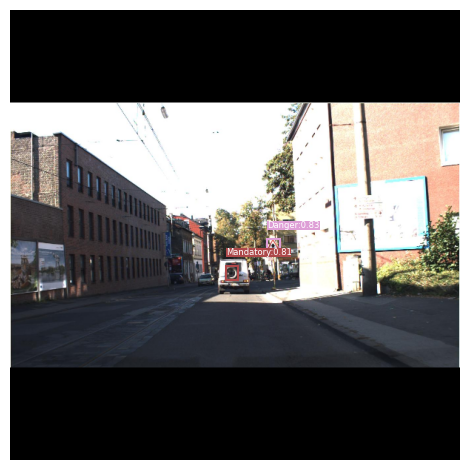

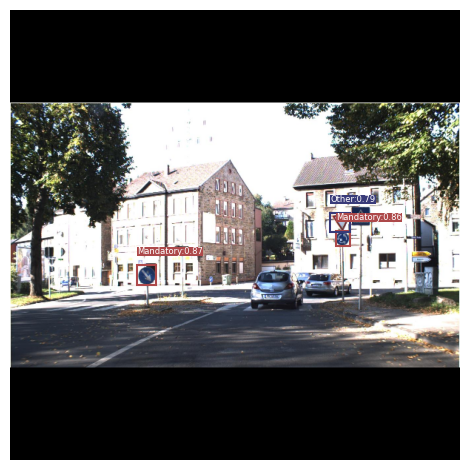

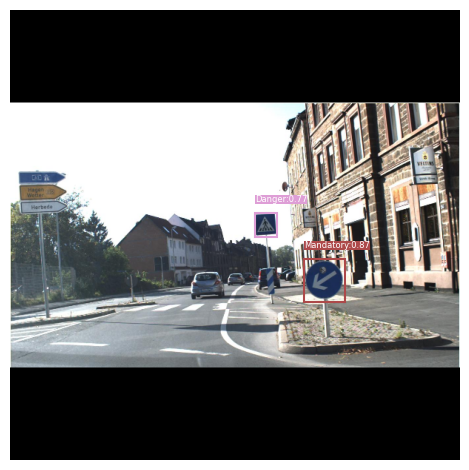

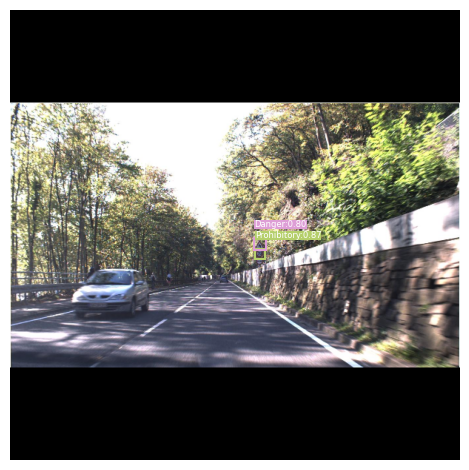

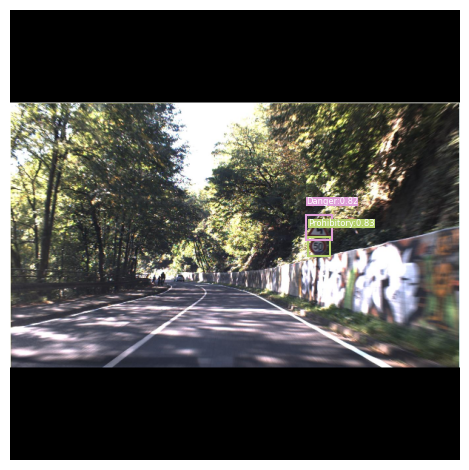

...

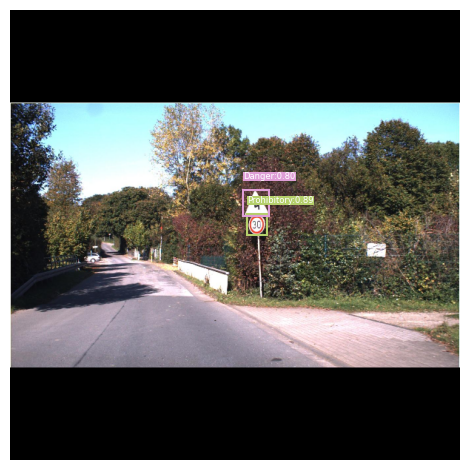

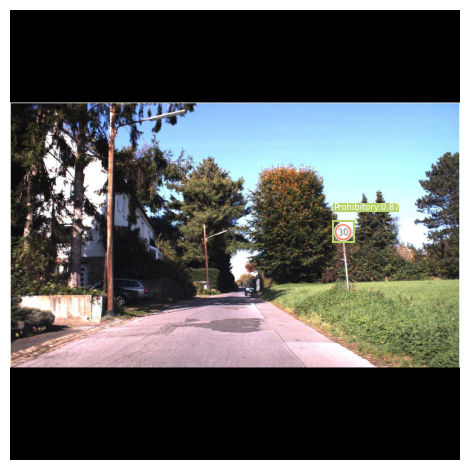

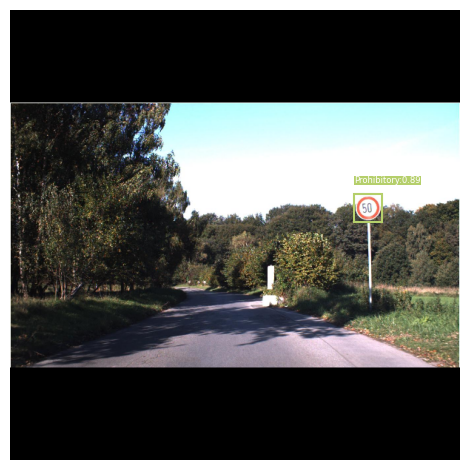

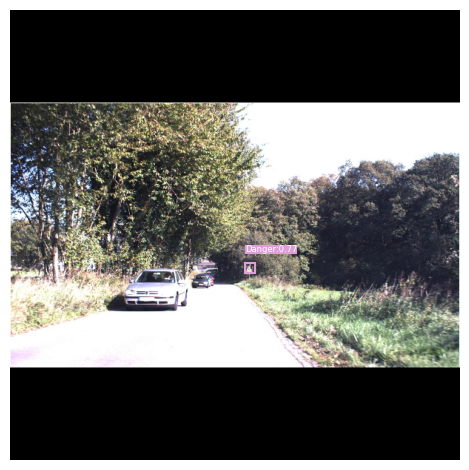

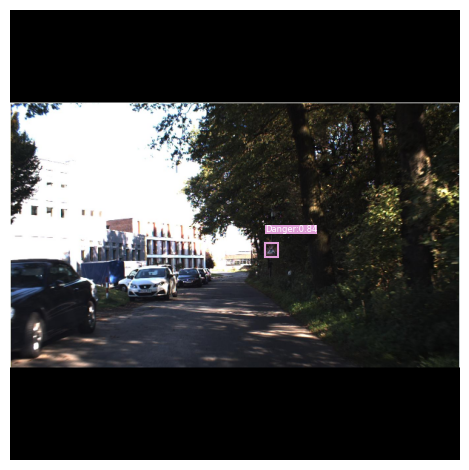

In [23]:
plot_couple_examples(model, train_eval_loader, 0.75, 0.30, scaled_anchors, class_labels_list = config.Reduced_GTSDB_Classes)

### Evaluate on Test set

In [24]:
check_class_accuracy(model, test_loader, threshold=config.CONF_THRESHOLD)

pred_boxes, true_boxes = get_evaluation_bboxes(
    test_loader,
    model,
    iou_threshold=config.NMS_IOU_THRESH,
    anchors=config.ANCHORS,
    threshold=config.CONF_THRESHOLD,
)
mapval = mean_average_precision(
    pred_boxes,
    true_boxes,
    iou_threshold=config.MAP_IOU_THRESH,
    box_format="midpoint",
    num_classes=config.NUM_CLASSES,
)
print(f"MAP: {mapval.item()}")

100%|██████████| 15/15 [00:16<00:00,  1.12s/it]


Class accuracy is: 96.675903%
No obj accuracy is: 99.948799%
Obj accuracy is: 88.827332%


100%|██████████| 15/15 [00:24<00:00,  1.61s/it]


MAP: 0.8538490533828735


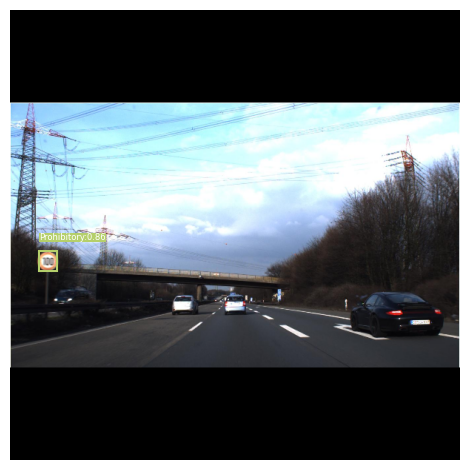

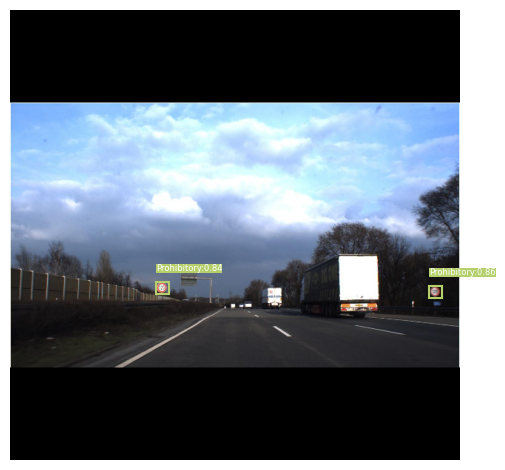

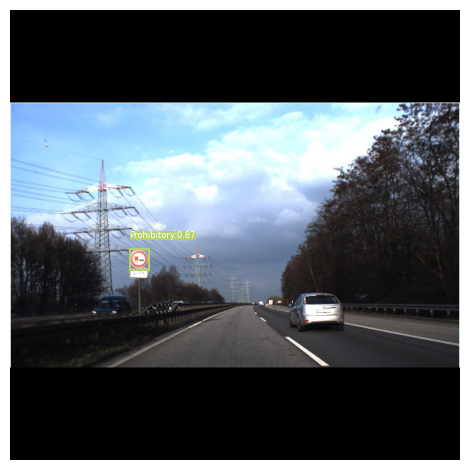

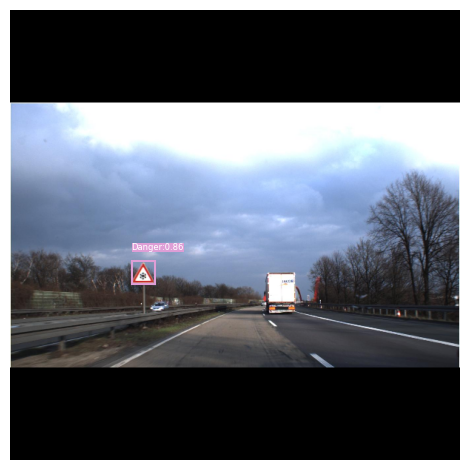

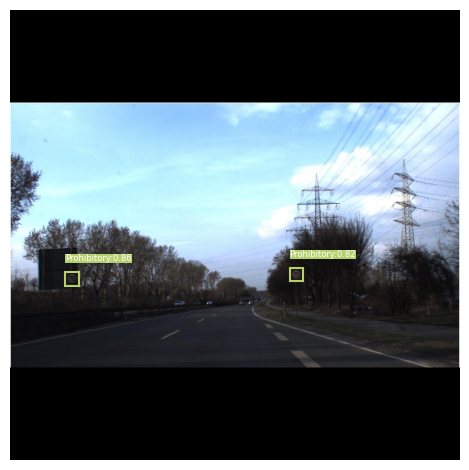

...

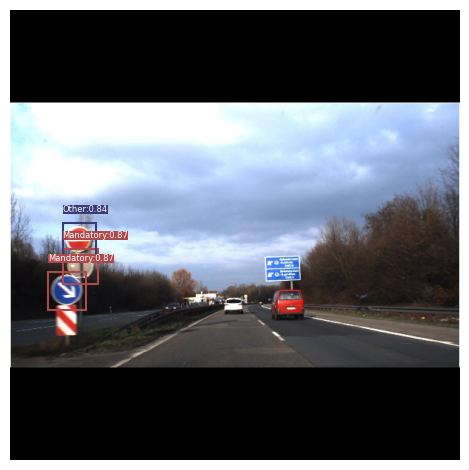

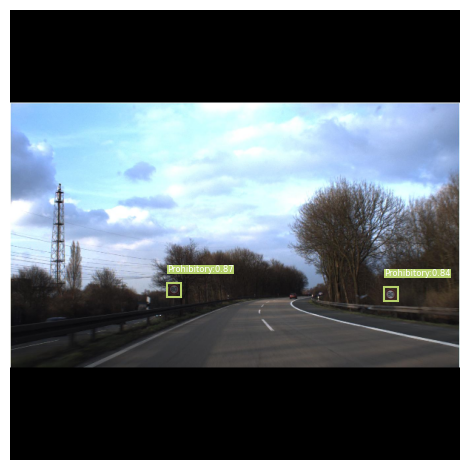

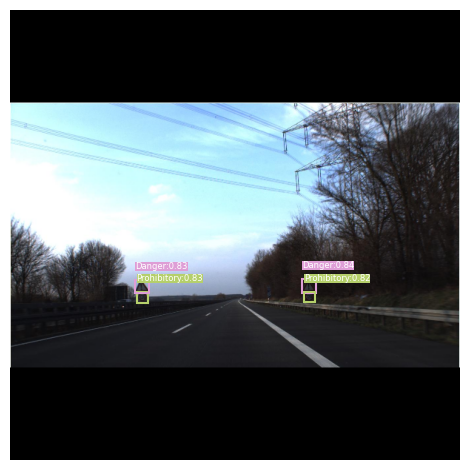

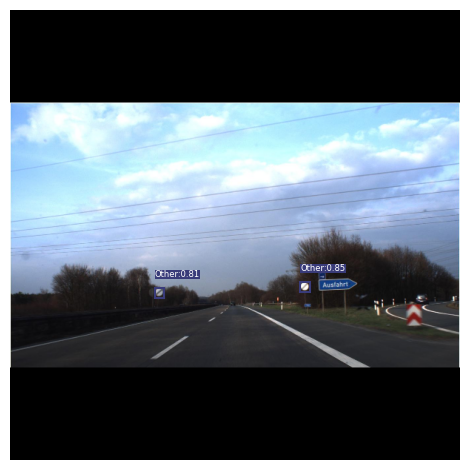

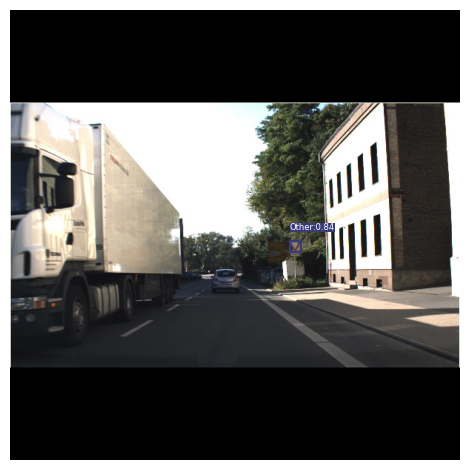

In [25]:
plot_couple_examples(model, test_loader, 0.75, 0.30, scaled_anchors, class_labels_list = config.Reduced_GTSDB_Classes)